In [1]:
import sys
import os
import warnings
import pandas as pd
import numpy as np
import anndata as ad
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib import colormaps
from glimmer.model import train_neighbor_weights, set_seed
from glimmer.utils import spatial_smooth

warnings.filterwarnings("ignore", category=SyntaxWarning)
warnings.filterwarnings('ignore', category=UserWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
%config InlineBackend.figure_format = 'retina'

In [2]:
# Define directory path and name
main_path = '/data/qiyu/spatialRegion/'
dir_path = main_path + "data/xenium/"
fig_path = main_path + 'figures/SVG/'
plt.rcParams['svg.fonttype'] = 'none'
plt.rcParams['font.family'] = 'DejaVu Sans' 

# FLH
path_flh = "xenium_hTonsil_follicular_lymphoid_hyperplasia"
subset_region_flh = (
    ['I' + str(i) for i in range(7, 12)] + 
    ['J' + str(i) for i in range(7, 12)] + 
    ['K' + str(i) for i in range(7, 12)]
)

# RFH
path_rfh = "xenium_hTonsil_reactive_follicular_hyperplasia"
subset_region_rfh = (
    ['W' + str(i) for i in range(14, 19)] +
    ['X' + str(i) for i in range(14, 19)] +
    ['Y' + str(i) for i in range(14, 19)] 
)

## 1. Spatial cellular clustering analysis (Bin-level)

In [8]:
# Combined
path_int = "xenium_hTonsil_FLH_RFH_subset_combined"
adata_int_path = f"{dir_path}{path_int}/processed_binned_adata_subset_scVI_cluster_lw200.h5ad"

if os.path.exists(adata_int_path):
    adata = sc.read(adata_int_path)
else:
    print("Processing combined adata...")

    # load FLH bineed adata
    adata_flh = sc.read_h5ad(os.path.join(dir_path, path_flh, "processed_binned_adata_subset.h5ad"))
    adata_flh.obs["slide"] = "FLH"
    adata_flh.obs_names = adata_flh.obs_names + "_FLH"

    # load RFH bineed adata
    adata_rfh = sc.read_h5ad(os.path.join(dir_path, path_rfh, "processed_binned_adata_subset.h5ad"))
    adata_rfh.obs["slide"] = "RFH"
    adata_rfh.obs_names = adata_rfh.obs_names + "_RFH"

    # Combined & remove batch
    import scvi

    adata = ad.concat([adata_flh, adata_rfh], join="outer")
    scvi.model.SCVI.setup_anndata(adata, batch_key="slide")
    model = scvi.model.SCVI(adata, n_latent=50, gene_likelihood="nb", dispersion="gene-batch")
    model.train(accelerator="gpu", devices=[1], max_epochs=500)
    adata.obsm["X_scVI"] = model.get_latent_representation()

    print('Training ScaleFlow')
    # Train neighbor weights
    seed = 42
    set_seed(seed)
    adata = train_neighbor_weights(
        adata, 
        feature_emb='X_scVI', 
        spatial_emb='spatial', 
        k=15, 
        spatial_w=1, 
        log_barrier_w=200, 
        sparisty_w=0.01,
        neighbor_weight=0.2,
        num_epochs=10000, 
        cuda='cuda:0', 
        seed=seed, 
        batch=True, 
        batch_size=8192,
    )
    print('Weight mean', adata.obs['Weight'].mean())
    sc.pp.neighbors(adata, use_rep='X_emb_smooth', random_state=seed)
    sc.tl.umap(adata) 
    sc.tl.leiden(adata, resolution=1.0, random_state=seed)
    adata.obs['leiden_1.0'] = adata.obs['leiden'].copy()
    sc.tl.leiden(adata, resolution=1.2, random_state=seed)
    adata.obs['leiden_1.2'] = adata.obs['leiden'].copy()
    adata.write(adata_int_path) 

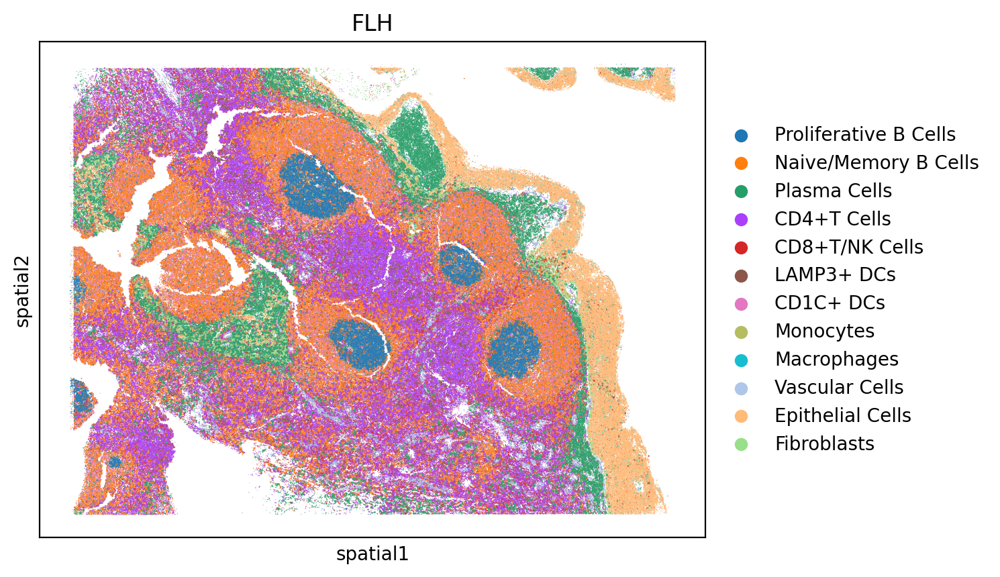

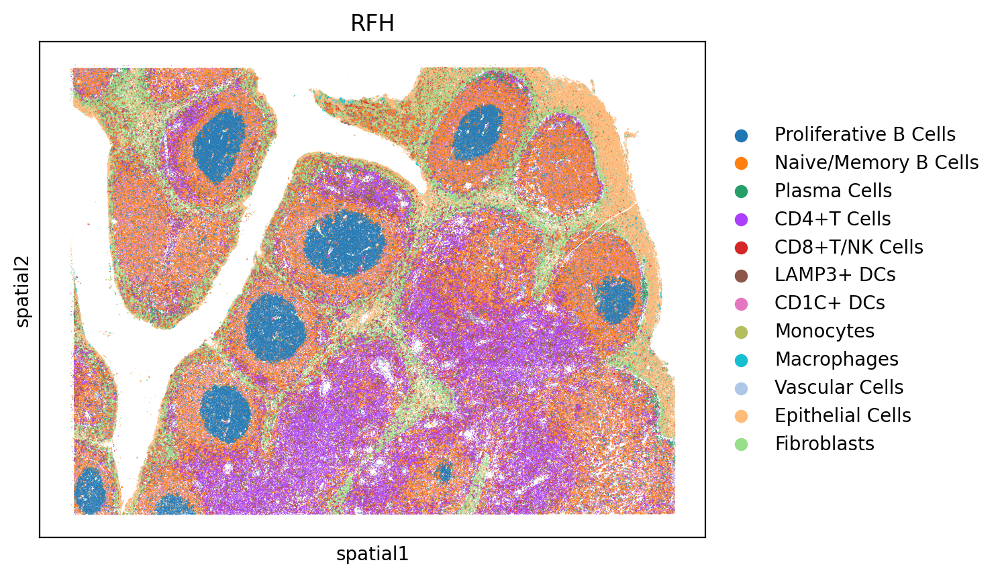

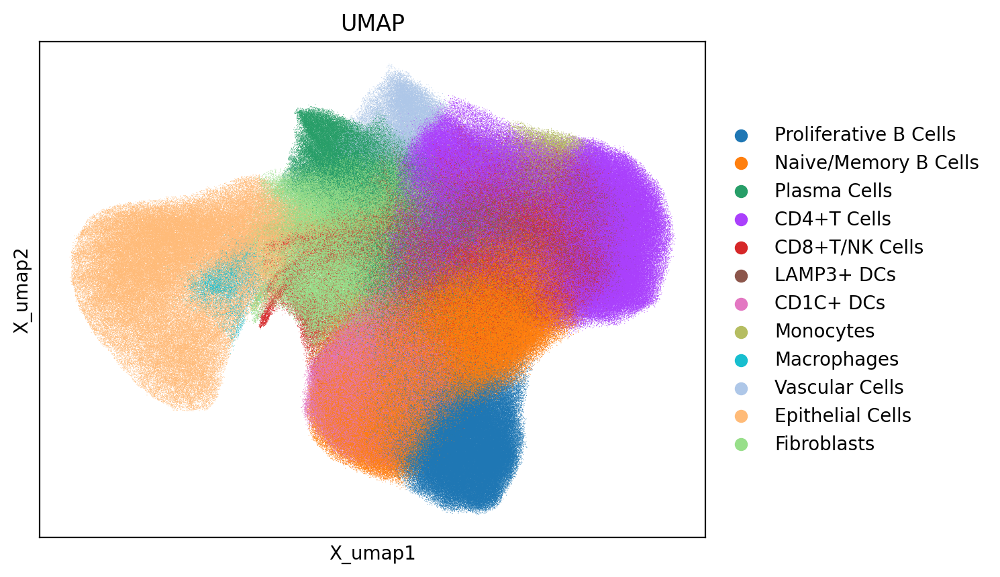

In [9]:
cluster_mapping = {
    "Proliferative B Cells": [2],
    "Naive/Memory B Cells": [1, 4, 9],
    "Plasma Cells": [6],
    "CD4+T Cells": [0, 3, 18],
    "CD8+T/NK Cells": [11, 12, 14],
    "LAMP3+ DCs": [10],
    "CD1C+ DCs": [5], 
    "Monocytes": [15], 
    "Macrophages": [17], 
    "Vascular Cells": [16],
    "Epithelial Cells": [13, 8],
    "Fibroblasts": [7],
} 
custom_palette = { 
    "Proliferative B Cells": "#1f77b4",
    "Naive/Memory B Cells": "#ff7f0e",
    "Plasma Cells": "#279e68",
    "CD4+T Cells": "#aa40fc", 
    "CD8+T/NK Cells": "#d62728",
    "LAMP3+ DCs": "#8c564b",
    "CD1C+ DCs": "#e377c2",
    "Monocytes": "#b5bd61",
    "Macrophages": "#17becf",
    "Vascular Cells": "#aec7e8",
    "Epithelial Cells": "#ffbb78",
    "Fibroblasts": "#98df8a"
}

cluster_key = 'leiden_1.0'
cluster_name_key = 'cluster_name'
cluster_to_name = {
    str(cid): name
    for name, ids in cluster_mapping.items()
    for cid in ids
}
adata.obs[cluster_name_key] = adata.obs[cluster_key].map(cluster_to_name)
adata.obs[cluster_name_key] = pd.Categorical(adata.obs[cluster_name_key], categories=list(cluster_mapping.keys()), ordered=True)

# Plot 
sc.pl.embedding(adata[adata.obs['slide'] == 'FLH'].copy(), basis='spatial', color=cluster_name_key, 
                palette=custom_palette, title="FLH", s=0.5)
sc.pl.embedding(adata[adata.obs['slide'] == 'RFH'].copy(), basis='spatial', color=cluster_name_key, 
                palette=custom_palette, title="RFH", s=0.5)
sc.pl.embedding(adata, basis='X_umap', color=cluster_name_key, palette=custom_palette, title="UMAP", s=0.5)

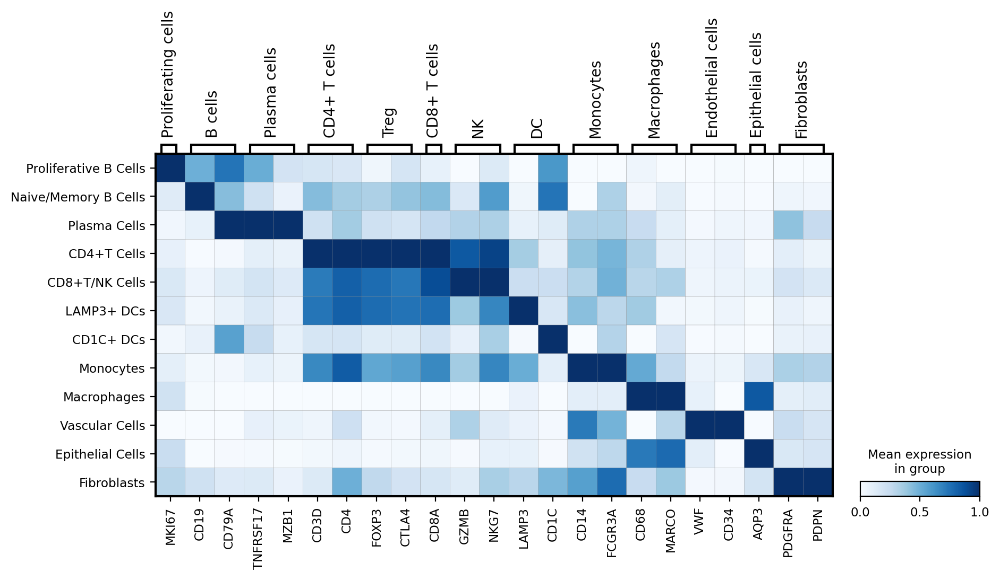

In [5]:
gene_dict = { 
    'Proliferating cells': ['MKI67'],
    'B cells': ['CD19', 'CD79A'],
    'Plasma cells': ['TNFRSF17', 'MZB1'],
    'CD4+ T cells': ['CD3D', 'CD4'],
    'Treg': ['FOXP3', 'CTLA4'],
    'CD8+ T cells': ['CD8A'],
    'NK': ['GZMB', 'NKG7'],
    "DC": ["LAMP3", "CD1C"], 
    'Monocytes': ["CD14", "FCGR3A"],
    'Macrophages': ["CD68", "MARCO"],
    'Endothelial cells': ["VWF", "CD34"],
    'Epithelial cells': ['AQP3'],
    "Fibroblasts": ["PDGFRA", "PDPN"]
}

gene_dict = {cell_type: [gene for gene in genes if gene in adata.var_names] for cell_type, genes in gene_dict.items()}
ax = sc.pl.matrixplot(adata, gene_dict, groupby=[cluster_name_key, cluster_key][0], cmap='Blues', standard_scale='var', dendrogram=False, vmax=1, vmin=0)

In [ ]:
save_fig = True

# spatial 
sc.settings.set_figure_params(dpi=100, figsize=(5.5, 4.2)) 
sc.pl.embedding(adata[adata.obs['slide'] == 'FLH'].copy(), basis='spatial', color=cluster_name_key, 
                palette=custom_palette, title="FLH", s=0.4, show=False)
if save_fig:
    fig_name = fig_path + 'figure5/fig5_m_xenium_tonsil_subset_FLH_spatial_clusters.svg'
    plt.savefig(fig_name, format="svg", bbox_inches="tight")
plt.close()
sc.pl.embedding(adata[adata.obs['slide'] == 'RFH'].copy(), basis='spatial', color=cluster_name_key, 
                palette=custom_palette, title="RFH", s=0.4, show=False)
if save_fig:
    fig_name = fig_path + 'figure5/fig5_m_xenium_tonsil_subset_RFH_spatial_clusters.svg'
    plt.savefig(fig_name, format="svg", bbox_inches="tight")
plt.close()

# UMAP
sc.settings.set_figure_params(dpi=100, figsize=(5, 4.5)) 
# cell type based
sc.pl.embedding(adata, basis='X_umap', color=cluster_name_key, palette=custom_palette, 
                title="UMAP", s=0.5, show=False)
if save_fig:
    fig_name = fig_path + 'figure5/fig5_m_xenium_tonsil_subset_combined_UMAP_clusters.svg'
    plt.savefig(fig_name, format="svg", bbox_inches="tight")
plt.close()
# batch based
sc.pl.embedding(adata, basis='X_umap', color='slide', title="UMAP", s=0.5, show=False)
if save_fig:
    fig_name = fig_path + 'figure5/fig5_m_xenium_tonsil_subset_combined_UMAP_slides.svg'
    plt.savefig(fig_name, format="svg", bbox_inches="tight")
plt.close()

# Marker gene expression
ax = sc.pl.matrixplot(adata, gene_dict, groupby=[cluster_name_key, 'leiden'][0], cmap='Blues', 
                      standard_scale='var', dendrogram=False, return_fig=True, show=False)
if save_fig:
    fig_name = fig_path + 'figure5/fig5_m_xenium_tonsil_subset_combined_cluster_markers.svg'
    ax.savefig(fig_name, format="svg", bbox_inches="tight")
    plt.close()

## 2. Spatial regional clustering analysis (Cellular segmentation based)

### 2.1 Glimmer segmentation

For the figures in paper, we didn't use this segmentation results

In [7]:
from glimmer.segment import assign_cell_by_voronoi, merge_small_cells, build_cell_matrices, get_pixel_size_from_ome, open_zarr

for folder in [path_flh, path_rfh]:
    # load transcripts file with nucleus id from DAPI
    transcripts_save_path = dir_path + folder + "/Xenium_output/transcripts_with_nucleus.csv.gz"
    if os.path.exists(transcripts_save_path):
        trans_df = pd.read_csv(transcripts_save_path)
    else:
        print("Loading nucleus_id from DAPI image")
        cells_root_path = dir_path + folder + "/Xenium_output/cells.zarr.zip"
        transcripts_path = dir_path + folder + "/Xenium_output/transcripts.csv.gz"
        mipurl = dir_path + folder + "/Xenium_output/morphology_mip.ome.tif"

        # pixel(um) to image(pix)
        pixel_size_x_um = pixel_size_y_um = 0.2125
        if pixel_size_x_um is None and pixel_size_y_um is None:
            from tifffile import TiffFile
            with TiffFile(mipurl) as tif:
                ome_xml = tif.pages[0].description
                pixel_size_x_um, pixel_size_y_um = get_pixel_size_from_ome(ome_xml)

        # load transcripts distribution
        trans_df = pd.read_csv(transcripts_path)
        x_coords = np.array(trans_df["x_location"])
        y_coords = np.array(trans_df["y_location"]) 
        x_pix = np.round(x_coords / pixel_size_x_um).astype(int)
        y_pix = np.round(y_coords / pixel_size_y_um).astype(int)

        # get nucleus id from DAPI
        nuc_root = open_zarr(cells_root_path)
        nucseg_mask = np.array(nuc_root["masks"][0])
        H, W = nucseg_mask.shape

        # add nucleus ids to pixel data
        valid = (x_pix >= 0) & (x_pix < W) & (y_pix >= 0) & (y_pix < H)
        df = pd.DataFrame({
            "x_location": x_coords[valid],
            "y_location": y_coords[valid],
            "nucleus_id": nucseg_mask[y_pix[valid], x_pix[valid]]
        })
        trans_df = trans_df.merge(df, on=["x_location", "y_location"], how="left")
        trans_df.to_csv(transcripts_save_path, index=False, compression="gzip") 
    
    # add nucleus ids to bin metadata
    if folder == path_flh:
        subset_adata = adata[adata.obs['slide'] == 'FLH'].copy()
        fov_list = subset_region_flh
        suffix = '_FLH'
    else:
        subset_adata = adata[adata.obs['slide'] == 'RFH'].copy()
        fov_list = subset_region_rfh
        suffix = '_RFH'

    # load pixel df with bin cluster information
    pixel_df_subset_path = os.path.join(dir_path, folder, "pixel_df_subset.csv")
    if os.path.exists(pixel_df_subset_path):
        pixel_df_subset = pd.read_csv(pixel_df_subset_path, index_col=0)
    else:
        # extract bin metadata
        bin_meta = pd.DataFrame(
            subset_adata.obsm['spatial'], 
            columns=['bin_x_centroid', 'bin_y_centroid'],
            index=subset_adata.obs_names
        )
        bin_meta = pd.concat([bin_meta, subset_adata.obs[['slide', 'cluster_name']]], axis=1)
        bin_meta = bin_meta.reset_index().rename(columns={'index': 'bin'})
        bin_meta['bin'] = bin_meta['bin'].str.replace(suffix, '', regex=True)  

        # merge transcripts with bin metadata
        pixel_df_path = os.path.join(dir_path, folder, "pixel_df.csv")
        pixel_df = pd.read_csv(pixel_df_path, index_col=0)
        fov_filtered = pixel_df[pixel_df['fov_name'].isin(fov_list)]
        trans_filtered = trans_df[trans_df['fov_name'].isin(fov_list)][['transcript_id', 'nucleus_id']]
        pixel_df_subset = (
            fov_filtered
            .merge(bin_meta, on='bin', how='left', sort=False)
            .set_index(fov_filtered.index)
            .merge(trans_filtered, on='transcript_id', how='left', sort=False)
            .dropna(subset=['cluster_name'])
        )
        pixel_df_subset.to_csv(pixel_df_subset_path)

    # Run ScaleFlow cell segmentation
    min_UMI = 3
    x = "x_location"
    y = "y_location"
    cluster_key = "cluster_name"
    output_col = "updated_cell_id_1"
    merged_col = "merged_cell_id_2"
    print(f"Running cell segmentation under cluster `{cluster_key}`")
    pixel_df_subset['nucleus_id'] = pixel_df_subset['nucleus_id'].replace(0, pd.NA).astype('Int64')

    result_df = assign_cell_by_voronoi(
        pixel_df_subset, x=x, y=y, nucleus_label="nucleus_id", cluster_label=cluster_key, 
        output_col=output_col, n_workers=None, max_distance=None, batch_size=1000, verbose=True
    )
    result_df.to_csv(os.path.join(dir_path, folder, "cell_segmentation_result_df.csv"))

    result_df_filtered = merge_small_cells(
        result_df, x=x, y=y, cluster=cluster_key, cell_id=output_col, output=merged_col, 
        min_UMI=min_UMI, filter=True, k_neighbors=1, verbose=True
    ) 
    result_df_filtered.to_csv(os.path.join(dir_path, folder, "cell_segmentation_result_df_filtered.csv"))

    print("Saving expression matrix and metadata")
    for i, (df, col) in enumerate([(result_df, output_col), (result_df_filtered, merged_col)], start=1):
        expression, metadata = build_cell_matrices(
            df, cluster_col=cluster_key, x_col=x, y_col=y, gene_col='feature_name', cell_col=col
        )
        expr_path = os.path.join(dir_path, folder, f"cell_segmentation_expression_{i}.csv.gz")
        meta_path = os.path.join(dir_path, folder, f"cell_segmentation_metadata_{i}.csv.gz")
        expression.to_csv(expr_path, compression='gzip')
        metadata.to_csv(meta_path, compression='gzip')

Running cell segmentation under cluster `cluster_name`
Building Voronoi diagram...
Using auto-calculated max_distance: 4.73
Assigning 3267321 unassigned transcripts...
Splitting clusters...
Filtering abnormal cells...
Assignment completed.
Found 36278 small cells with <= 3 UMIs
Merged 14021 cells out of 36278 small cells
Filtered out 15545 cells with less than 3 UMIs
Saving expression matrix and metadata
Running cell segmentation under cluster `cluster_name`
Building Voronoi diagram...
Using auto-calculated max_distance: 4.02
Assigning 3220279 unassigned transcripts...
Splitting clusters...
Filtering abnormal cells...
Assignment completed.
Found 58934 small cells with <= 3 UMIs
Merged 22741 cells out of 58934 small cells
Filtered out 24763 cells with less than 3 UMIs
Saving expression matrix and metadata


### 2.2 Xenium default segmentation (Used the the final figure)

### 2.2.1 Refine cluster assignment based on bin-level clustering labels

In [112]:
for folder in [path_flh, path_rfh]: 
    # add nucleus ids to bin metadata 
    if folder == path_flh:
        subset_adata = adata[adata.obs['slide'] == 'FLH'].copy()
        fov_list = subset_region_flh
        suffix = '_FLH'
    else:
        subset_adata = adata[adata.obs['slide'] == 'RFH'].copy()
        fov_list = subset_region_rfh
        suffix = '_RFH'
    
    adata_save_name = os.path.join(dir_path, folder, "xenium_adata_labeled.h5ad")
    if not os.path.exists(adata_save_name):
        # load transcripts file with nucleus id from DAPI
        transcripts_save_path = dir_path + folder + "/Xenium_output/transcripts_with_nucleus.csv.gz"
        trans_df = pd.read_csv(transcripts_save_path)
        trans_filtered = trans_df[trans_df['fov_name'].isin(fov_list)][['transcript_id', 'nucleus_id']]

        # extract bin metadata
        bin_meta = pd.DataFrame(subset_adata.obsm['spatial'], columns=['bin_x_centroid', 'bin_y_centroid'], 
                                index=subset_adata.obs_names)
        leiden_keys = ["leiden_1.0", "leiden_1.2", "leiden_1.5", "leiden_2.0"]
        bin_meta = pd.concat([bin_meta, subset_adata.obs[leiden_keys]], axis=1) 
        bin_meta = bin_meta.reset_index().rename(columns={'index': 'bin'})
        bin_meta['bin'] = bin_meta['bin'].str.replace(suffix, '', regex=True)  

        # merge transcripts with bin metadata
        pixel_df_path = os.path.join(dir_path, folder, "pixel_df.csv")
        pixel_df = pd.read_csv(pixel_df_path, index_col=0)
        fov_filtered = pixel_df[pixel_df['fov_name'].isin(fov_list)]
        pixel_df_subset = (
            fov_filtered
            .merge(bin_meta, on='bin', how='left', sort=False)
            .set_index(fov_filtered.index)
            .merge(trans_filtered, on='transcript_id', how='left', sort=False)
        )

        # create adata 
        adata_xenium = sc.read_10x_h5(dir_path + folder + '/cell_feature_matrix.h5')
        adata_xenium.var_names_make_unique()
        com_cells = adata_xenium.obs_names.intersection(pixel_df_subset['cell_id'].unique())
        adata_xenium = adata_xenium[com_cells].copy()

        # coordinate
        coord = pd.read_csv(dir_path + folder + "/cells.csv.gz").set_index('cell_id')
        coord = coord.reindex(adata_xenium.obs_names)[['x_centroid', 'y_centroid']].copy()
        coord['y_centroid'] = coord['y_centroid'].max() - coord['y_centroid']
        adata_xenium.obsm['spatial'] = coord.values  

        # add cell type from ScaleFlow
        cluster_df = pd.DataFrame(index=pixel_df_subset['cell_id'].unique())
        for cluster_key in leiden_keys:
            count_df = pixel_df_subset.groupby(['cell_id', cluster_key]).size().reset_index(name='count')
            count_pivot = count_df.pivot(index='cell_id', columns=cluster_key, values='count').fillna(0)
            cluster_proportion_df = count_pivot.div(count_pivot.sum(axis=1), axis=0) * 100
            cluster_df[cluster_key + '_dominant'] = cluster_proportion_df.idxmax(axis=1)
        adata_xenium.obs = adata_xenium.obs.join(cluster_df)
        adata_xenium.write(adata_save_name) 

In [14]:
# load FLH bineed adata
adata_flh = sc.read_h5ad(os.path.join(dir_path, path_flh, "xenium_adata_labeled.h5ad"))
adata_flh.obs["slide"] = "FLH"
adata_flh.obs_names = adata_flh.obs_names + "_FLH"

# load RFH bineed adata
adata_rfh = sc.read_h5ad(os.path.join(dir_path, path_rfh, "xenium_adata_labeled.h5ad"))
adata_rfh.obs["slide"] = "RFH"
adata_rfh.obs_names = adata_rfh.obs_names + "_RFH"

# Combined 
adata = ad.concat([adata_flh, adata_rfh], join="outer")

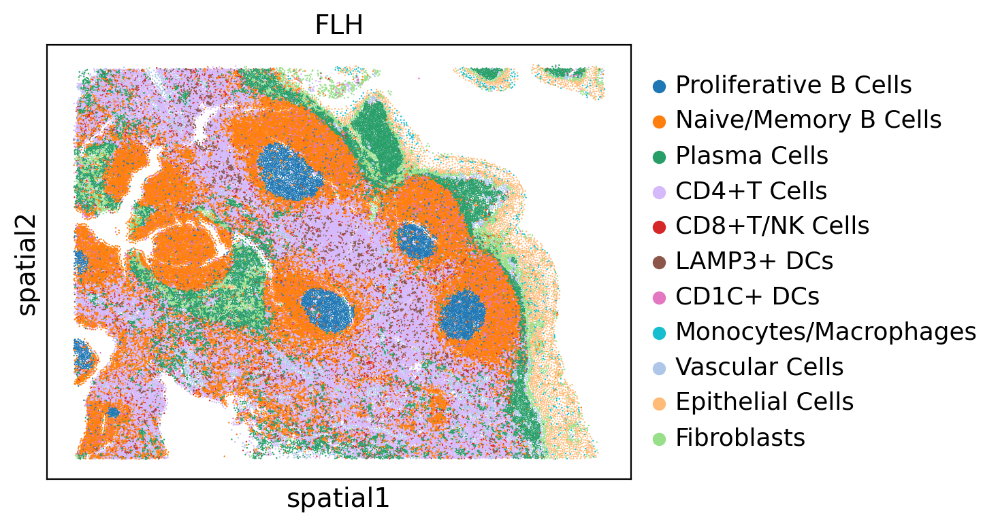

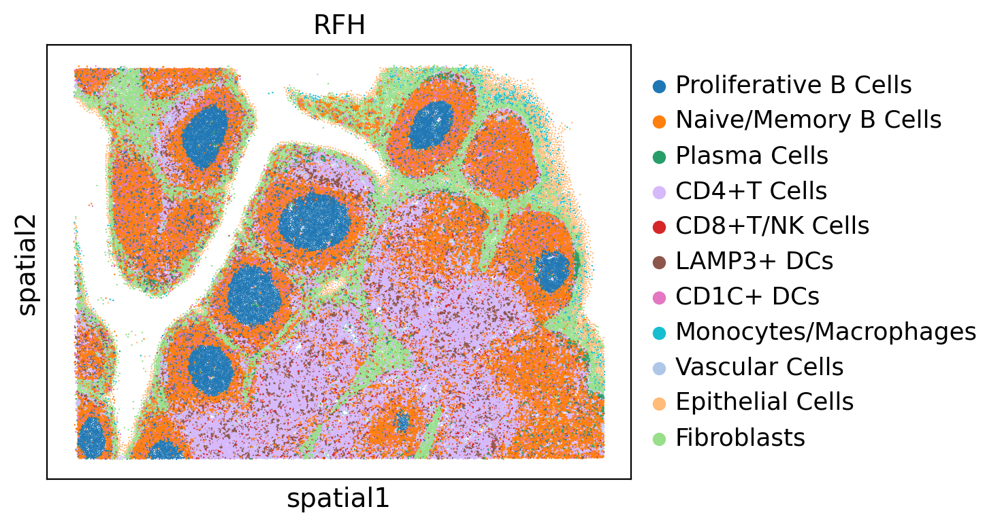

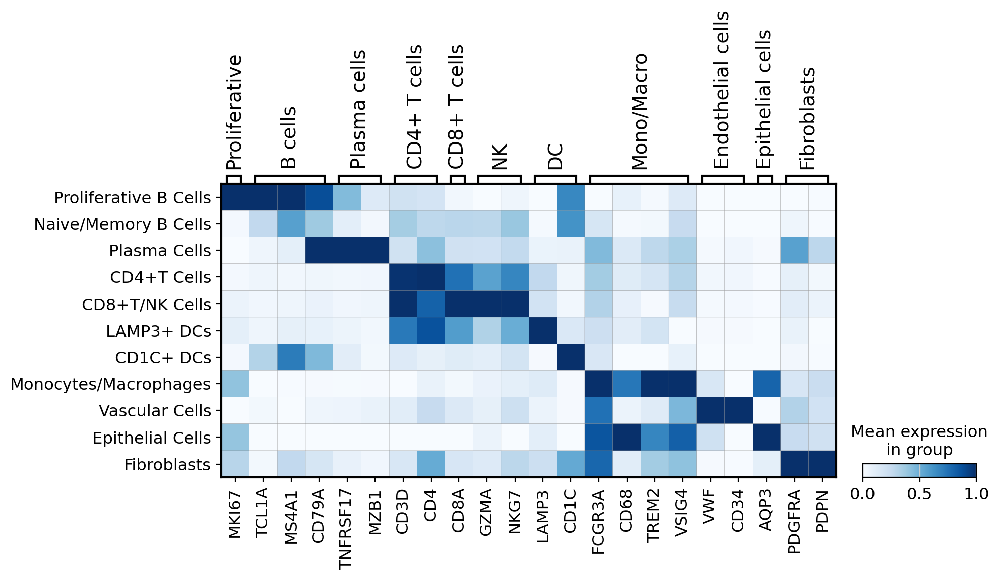

In [16]:
cluster_mapping = {
    "Proliferative B Cells": [2],
    "Naive/Memory B Cells": [1, 6, 10, 12, 13, 16, 21],
    "Plasma Cells": [4],
    "CD4+T Cells": [0, 3, 9, 17],
    "CD8+T/NK Cells": [14],
    "LAMP3+ DCs": [7],
    "CD1C+ DCs": [8],
    "Monocytes/Macrophages": [18, 22, 20], 
    "Vascular Cells": [19],
    "Epithelial Cells": [11],
    "Fibroblasts": [5, 15],
} 

custom_palette = { 
    "Proliferative B Cells": "#1f77b4",
    "Naive/Memory B Cells": "#ff7f0e",
    "Plasma Cells": "#279e68",
    "CD4+T Cells": "#d5b9fb",
    "CD8+T/NK Cells": "#d62728",
    "LAMP3+ DCs": "#8c564b",
    "CD1C+ DCs": "#e377c2", 
    "Monocytes/Macrophages": "#17becf",
    "Vascular Cells": "#aec7e8",
    "Epithelial Cells": "#ffbb78",
    "Fibroblasts": "#98df8a"
}

gene_dict = { 
    'Proliferative': ['MKI67'],
    'B cells': ['TCL1A', 'MS4A1', 'CD79A'],
    'Plasma cells': ['TNFRSF17', 'MZB1'],
    'CD4+ T cells': ['CD3D', 'CD4'],
    'CD8+ T cells': ['CD8A'],
    'NK': ['GZMA', 'NKG7'],
    "DC": ["LAMP3", "CD1C"], 
    'Mono/Macro': ["FCGR3A", "CD68", "TREM2", 'VSIG4'],
    'Endothelial cells': ["VWF", "CD34"],
    'Epithelial cells': ['AQP3'],
    "Fibroblasts": ["PDGFRA", "PDPN"]
}

cluster_key = 'leiden_1.2_dominant'
cluster_name_key = 'cluster_name'
cluster_to_name = {
    str(cid): name
    for name, ids in cluster_mapping.items()
    for cid in ids
}
adata.obs[cluster_name_key] = adata.obs[cluster_key ].map(cluster_to_name)
adata.obs[cluster_name_key] = pd.Categorical(adata.obs[cluster_name_key], categories=list(cluster_mapping.keys()), ordered=True)
adata = adata[~adata.obs[cluster_name_key].isna()].copy()

sc.pl.embedding(adata[adata.obs['slide'] == 'FLH'].copy(), basis='spatial', color=cluster_name_key, 
                palette=custom_palette, title="FLH", s=3)
sc.pl.embedding(adata[adata.obs['slide'] == 'RFH'].copy(), basis='spatial', color=cluster_name_key, 
                palette=custom_palette, title="RFH", s=3)
gene_dict = {cell_type: [gene for gene in genes if gene in adata.var_names] for cell_type, genes in gene_dict.items()}
ax = sc.pl.matrixplot(adata, gene_dict, groupby=cluster_name_key, cmap='Blues', standard_scale='var', dendrogram=False, vmax=1, vmin=0)

In [ ]:
save_fig = True

# spatial 
sc.settings.set_figure_params(dpi=100, figsize=(5.5, 4.2)) 
sc.pl.embedding(adata[adata.obs['slide'] == 'FLH'].copy(), basis='spatial', color=cluster_name_key, 
                palette=custom_palette, title="FLH", s=3, show=False)
if save_fig:
    fig_name = fig_path + 'figure5/fig5_m_xenium_tonsil_cell_based_subset_FLH_spatial_clusters.svg'
    plt.savefig(fig_name, format="svg", bbox_inches="tight")
plt.close()
sc.pl.embedding(adata[adata.obs['slide'] == 'RFH'].copy(), basis='spatial', color=cluster_name_key, 
                palette=custom_palette, title="RFH", s=3, show=False)
if save_fig:
    fig_name = fig_path + 'figure5/fig5_m_xenium_tonsil_cell_based_subset_RFH_spatial_clusters.svg'
    plt.savefig(fig_name, format="svg", bbox_inches="tight")
plt.close()

# Marker gene expression
if save_fig:
    ax = sc.pl.matrixplot(adata, gene_dict, groupby=[cluster_name_key, 'leiden'][0], cmap='Blues', 
                          standard_scale='var', dendrogram=False, return_fig=True, show=False)
    fig_name = fig_path + 'figure5/fig5_m_xenium_tonsil_cell_based_subset_combined_cluster_markers.svg'
    ax.savefig(fig_name, format="svg", bbox_inches="tight")
    plt.close()

### 2.2.1 Region assignment

In [18]:
path_int = "xenium_hTonsil_FLH_RFH_subset_combined"
adata_int_path = os.path.join(dir_path, path_int,"processed_xenium_adata_subset_scVI_labeled_lw5_nw01.h5ad") 
if os.path.exists(adata_int_path):
    adata = sc.read_h5ad(adata_int_path)
else:
    seed = 42
    set_seed(seed)

    # remove batch
    import scvi
    scvi.model.SCVI.setup_anndata(adata, batch_key="slide")
    model = scvi.model.SCVI(adata, n_latent=50, gene_likelihood="nb", dispersion="gene-batch")
    model.train(accelerator="gpu", devices=[1], max_epochs=500)
    adata.obsm["X_scVI"] = model.get_latent_representation()

    # Train ScaleFlow
    print('Training region weights')
    adata = train_neighbor_weights(
        adata, 
        feature_emb='X_scVI', 
        spatial_emb='spatial', 
        output_emb='X_emb_region',
        k=50, 
        spatial_w=1, 
        log_barrier_w=5, 
        sparisty_w=0.01,
        neighbor_weight=0.1,
        num_epochs=10000, 
        cuda='cuda:1', 
        seed=seed, 
        batch=True, 
        batch_size = 8192, 
    )
    print('Weight mean', adata.obs['Weight'].mean())
    sc.pp.neighbors(adata, use_rep='X_emb_region', random_state=seed)
    resolutions = [1.0, 0.8, 0.6, 0.4, 0.2]
    for res in resolutions:
        sc.tl.leiden(adata, resolution=res, key_added='leiden')
        adata.obs[f'leiden_region_{res}'] = adata.obs['leiden'].copy()
        adata = spatial_smooth(
            adata,
            label_key=f'leiden_region_{res}',
            region_key=f'region_{res}',
            emb_key='X_emb_region',
            spatial_key='spatial'
        )
    adata.write_h5ad(adata_int_path) 

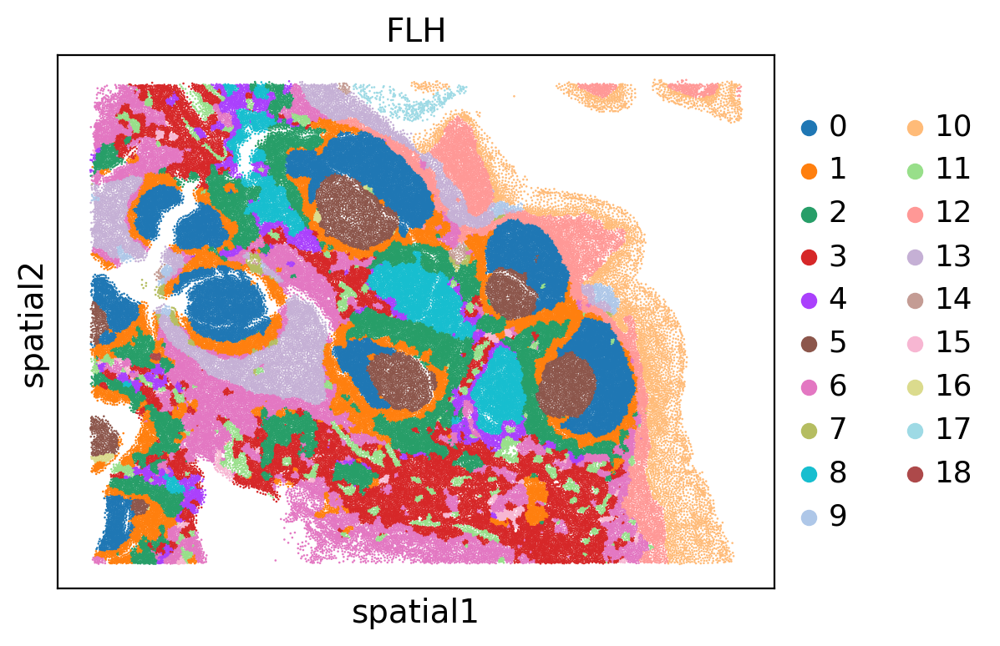

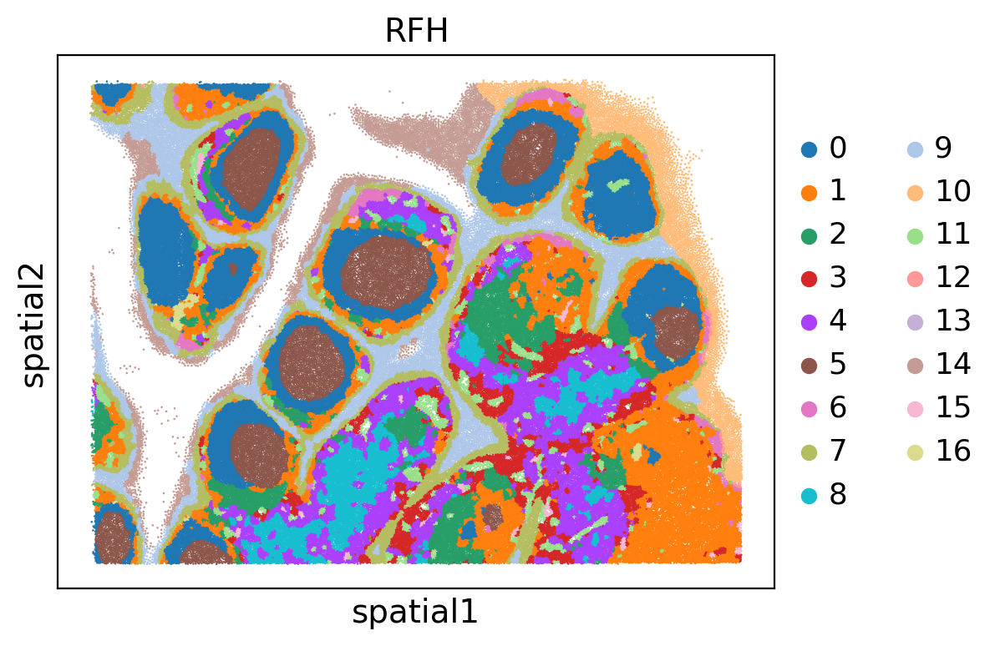

In [19]:
region_key = ['leiden_region_1.0', 
              'leiden_region_0.8', 
              'leiden_region_0.6', 
              'leiden_region_0.4', 
              'leiden_region_0.2', 
              'region_1.0', 
              'region_0.8', 
              'region_0.6'][5] 
sc.pl.embedding(adata[adata.obs['slide'] == 'FLH'].copy(), basis='spatial', color=region_key, s=3.5, title='FLH') 
sc.pl.embedding(adata[adata.obs['slide'] == 'RFH'].copy(), basis='spatial', color=region_key, s=3.5, title='RFH')

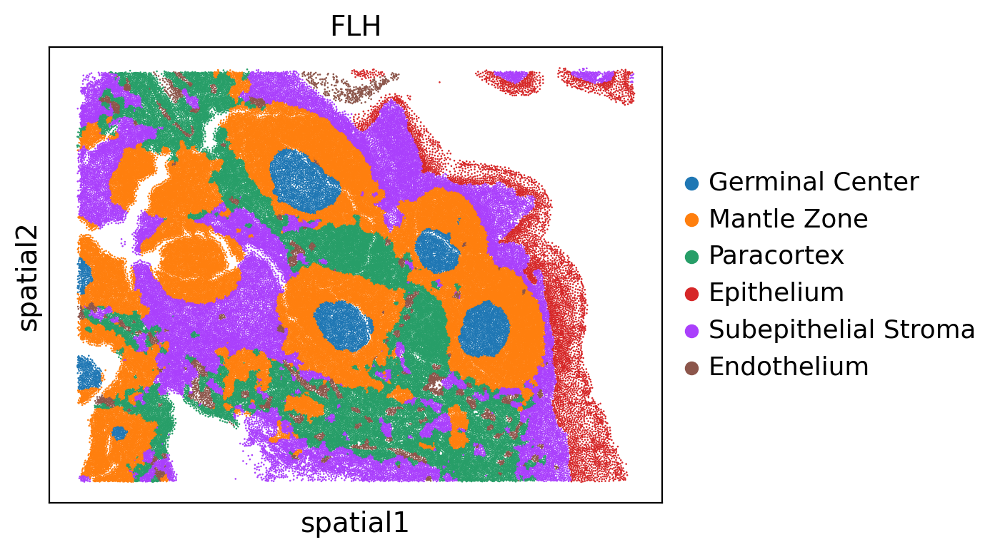

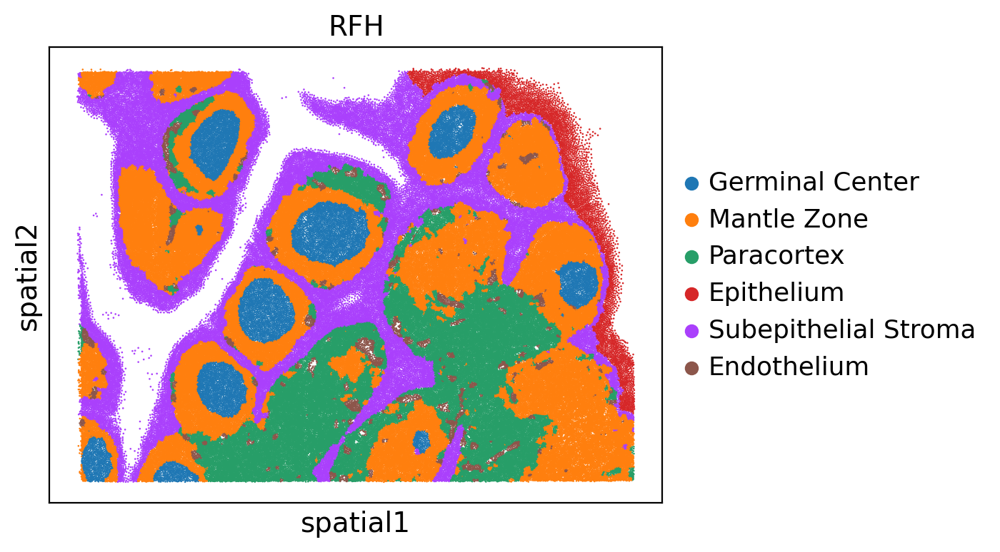

In [21]:
# region_1.0
region_mapping = {
    "Germinal Center": [5],
    "Mantle Zone": [0, 1, 2, 16, 18],
    "Paracortex": [3, 4, 8, 15], 
    "Epithelium": [10], 
    "Subepithelial Stroma": [6, 7, 9, 12, 13, 14],
    "Endothelium": [11, 17],
}
custom_palette = {
    "Germinal Center": "#d62728",  
    "Mantle Zone": "#ff7f0e", 
    "Paracortex": "#1f77b4",
    "Endothelium": "#8c564b",
    "Epithelium": "#e377c2",  
    "Subepithelial Stroma": "#9467bd"
}
region_name_key = 'region_name'
flat_mapping = {str(cluster): name for name, clusters in region_mapping.items() for cluster in clusters}
adata.obs[region_name_key] = adata.obs[region_key].map(flat_mapping)
region_order = list(region_mapping.keys())
adata.obs[region_name_key] = pd.Categorical(adata.obs[region_name_key], categories=region_order, ordered=True)
ps = 3.5
sc.pl.embedding(adata[adata.obs['slide'] == 'FLH'].copy(), basis='spatial', color=region_name_key, s=ps, title='FLH')
sc.pl.embedding(adata[adata.obs['slide'] == 'RFH'].copy(), basis='spatial', color=region_name_key, s=ps, title='RFH')

In [91]:
save_fig = True

# spatial 
sc.settings.set_figure_params(dpi=100, figsize=(5.5, 4.2)) 
sc.pl.embedding(adata[adata.obs['slide'] == 'FLH'].copy(), basis='spatial', color=region_name_key, s=ps, title='FLH', show=False)
fig_name = fig_path + 'figure5/fig5_m_xenium_tonsil_cell_based_subset_FLH_spatial_regions.svg'
if save_fig:
    plt.savefig(fig_name, format="svg", bbox_inches="tight")
plt.close()
sc.pl.embedding(adata[adata.obs['slide'] == 'RFH'].copy(), basis='spatial', color=region_name_key, s=ps, title='RFH', show=False)
fig_name = fig_path + 'figure5/fig5_m_xenium_tonsil_cell_based_subset_RFH_spatial_regions.svg'
if save_fig:
    plt.savefig(fig_name, format="svg", bbox_inches="tight")
plt.close()

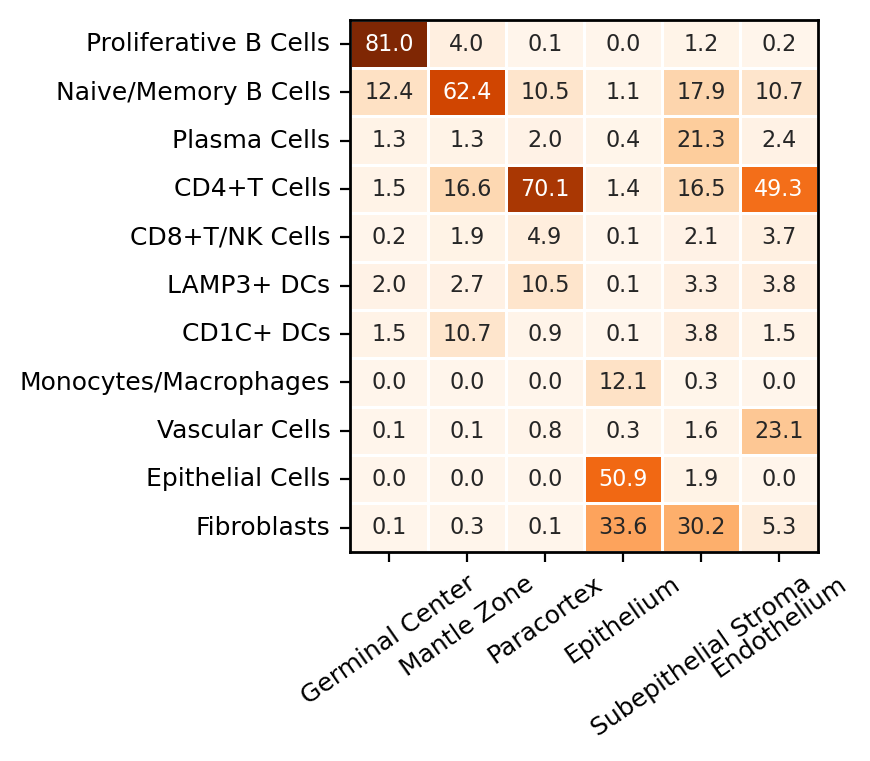

In [100]:
cluster_name_key = 'cluster_name'
region_name_key = 'region_name'
count_matrix = (
    adata.obs.groupby([region_name_key, cluster_name_key])
    .size()
    .unstack(fill_value=0) 
)
percent_matrix = count_matrix.div(count_matrix.sum(axis=1), axis=0) * 100  
percent_matrix = percent_matrix.T

# Plot heatmap
plt.figure(figsize=(3, 3.5))
ax = sns.heatmap(percent_matrix, cmap="Oranges", annot=True, fmt=".1f", linewidths=1, annot_kws={"size": 8}, cbar=False)
ax.set_xlabel("")
ax.set_ylabel("")
ax.tick_params(axis="x", labelsize=9, rotation=35)
ax.tick_params(axis="y", labelsize=9)
plt.grid(False) 
plt.title("")
for _, spine in ax.spines.items():
    spine.set_visible(True)  
    spine.set_linewidth(1) 
    spine.set_color("black") 

fig_name = fig_path + 'figure5/fig5_m_xenium_tonsil_subset_combined_cluster_proportions_cell_based.svg'
plt.savefig(fig_name, format="svg", bbox_inches="tight")
plt.show() 